<a href="https://colab.research.google.com/github/Huicccc/AI-Python/blob/main/Numbers_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
# import libraries
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt


In [17]:
# visualization function
# black/white: channel=1, size of data: 28p*28p, 16 images = 4rowsx4colums grid
def show(tensor, ch=1, size = (28,28), num = 16): 
  # tensor: train 128 images x (28*28)
  # reshape tensor 128(remain) x 1(ch) x 28x28(*size)
  data = tensor.detach().cpu().view(-1, ch, *size)
  # select first 16 data of 128  
  grid = make_grid(data[:num], nrow = 4).permute(1,2,0) # 1x28x28 = 28x28x1
  plt.imshow(grid)
  plt.show()

In [18]:
# setup of the main parameters and hyperparameters
epochs = 500
cur_step = 0
info_step = 300 # show information in screen
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001 # learning rate
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cuda' # GPU

# shuffle everytime
dataloader = DataLoader(MNIST('.', download=True, transform = transforms.ToTensor()), shuffle=True, batch_size = bs)

# 60000 / 128 = 468.75  = 469 steps in each epoch
# Each step is going to process 128 images = size of the batch (except the last step)

In [26]:
# declare our models

## Generator
# inp:size of input, out:size of output
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out), # normalize 1d: back/white single channel
      nn.ReLU(inplace=True) # nonlinear transformation
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=28 * 28, h_dim=128): # hidden layer
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim), # 64->128
        genBlock(h_dim, h_dim*2), # 128->256
        genBlock(h_dim*2, h_dim*4), # 256->512
        genBlock(h_dim*4, h_dim*8), # 512->1024
        nn.Linear(h_dim*8, i_dim), # 1024->784 (28x28)
        nn.Sigmoid(), # value between 0 and 1
    )
    
  def forward(self, noise):
    return self.gen(noise)

# generate noise
def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

## Discriminator
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2) 
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256): 
    super().__init__()
    self.disc=nn.Sequential(
        discBlock(i_dim, h_dim*4), # 784, 1024
        discBlock(h_dim*4, h_dim*2), # 1024, 512
        discBlock(h_dim*2, h_dim), # 512, 256
        nn.Linear(h_dim, 1) # 256, 1
    )
  def forward(self, image):
      return self.disc(image)

In [27]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
#gen
#disc

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([3, 2, 4, 9, 3, 8, 4, 9, 4, 3])


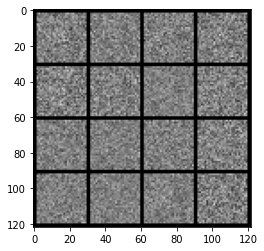

In [28]:
x,y=next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [29]:
# calculating the loss

# generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   pred = disc(fake)
   targets=torch.ones_like(pred)
   gen_loss=loss_func(pred,targets)

   return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   disc_fake = disc(fake.detach())
   disc_fake_targets=torch.zeros_like(disc_fake)
   disc_fake_loss=loss_func(disc_fake, disc_fake_targets)

   disc_real = disc(real)
   disc_real_targets=torch.ones_like(disc_real)
   disc_real_loss=loss_func(disc_real, disc_real_targets)

   disc_loss=(disc_fake_loss+disc_real_loss)/2

   return disc_loss

  0%|          | 0/469 [00:00<?, ?it/s]

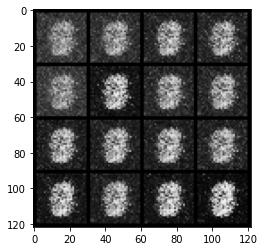

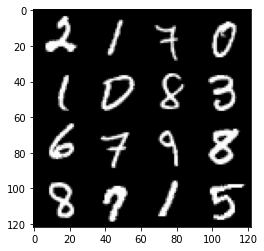

0: step 300 / Gen loss: 1.9698991298675532 / disc_loss: 0.333464629476269


  0%|          | 0/469 [00:00<?, ?it/s]

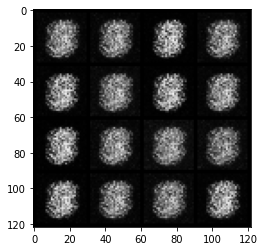

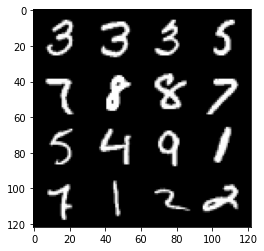

1: step 600 / Gen loss: 3.4553376682599404 / disc_loss: 0.11974724044402432


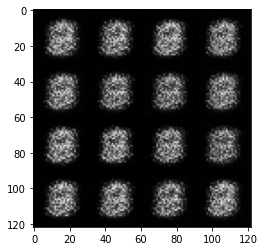

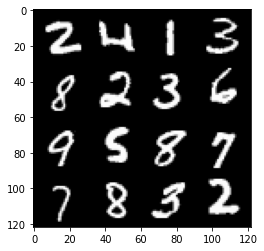

1: step 900 / Gen loss: 3.4118450474739057 / disc_loss: 0.05702824280907711


  0%|          | 0/469 [00:00<?, ?it/s]

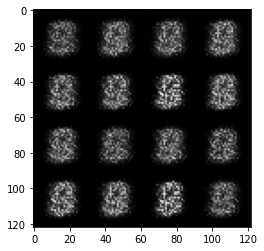

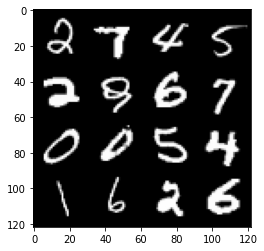

2: step 1200 / Gen loss: 3.5347312943140685 / disc_loss: 0.03680952795470753


  0%|          | 0/469 [00:00<?, ?it/s]

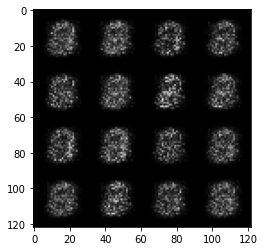

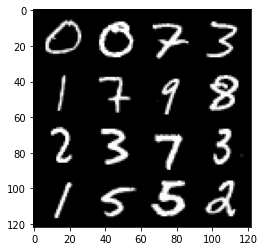

3: step 1500 / Gen loss: 3.4402255702018745 / disc_loss: 0.039834307407339405


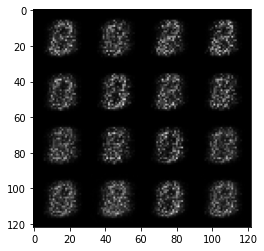

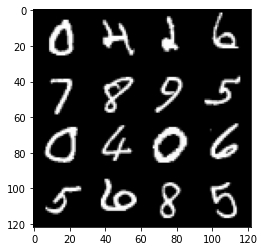

3: step 1800 / Gen loss: 3.4210190121332804 / disc_loss: 0.04536687293400363


  0%|          | 0/469 [00:00<?, ?it/s]

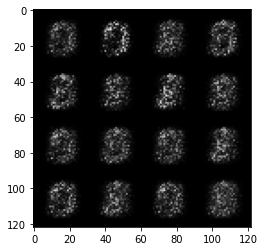

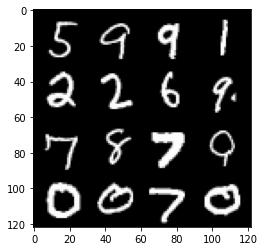

4: step 2100 / Gen loss: 3.668013888994855 / disc_loss: 0.039109692014753825


  0%|          | 0/469 [00:00<?, ?it/s]

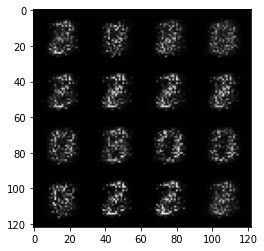

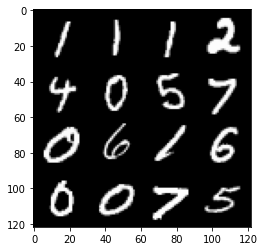

5: step 2400 / Gen loss: 4.0857275390625 / disc_loss: 0.029251345538844665


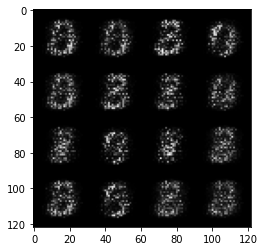

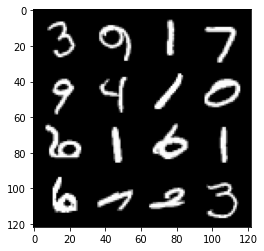

5: step 2700 / Gen loss: 4.452393395105996 / disc_loss: 0.021701228674501194


  0%|          | 0/469 [00:00<?, ?it/s]

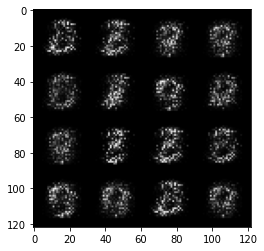

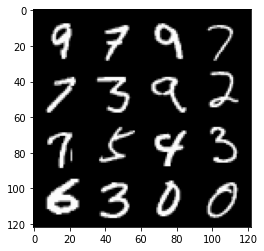

6: step 3000 / Gen loss: 4.8749704980850215 / disc_loss: 0.01925097569823265


  0%|          | 0/469 [00:00<?, ?it/s]

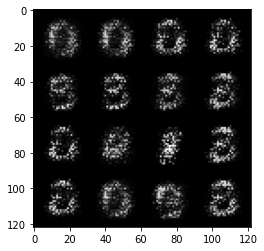

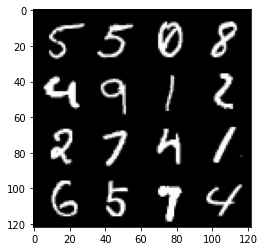

7: step 3300 / Gen loss: 5.227079962094627 / disc_loss: 0.018577623581513755


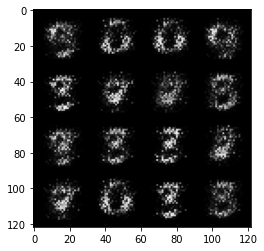

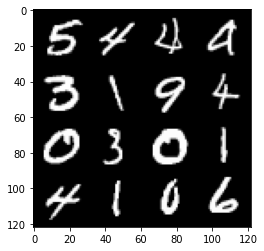

7: step 3600 / Gen loss: 5.388206399281821 / disc_loss: 0.021073493286967268


  0%|          | 0/469 [00:00<?, ?it/s]

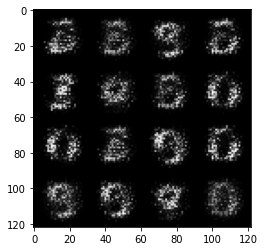

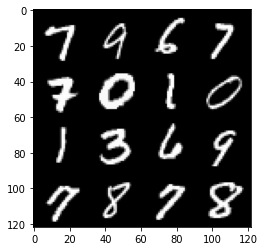

8: step 3900 / Gen loss: 5.479773721694941 / disc_loss: 0.02008321649394932


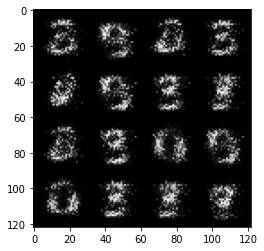

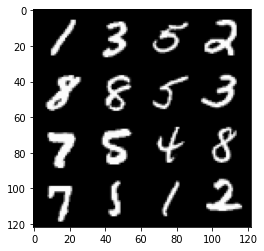

8: step 4200 / Gen loss: 5.549773794809979 / disc_loss: 0.018765736610318242


  0%|          | 0/469 [00:00<?, ?it/s]

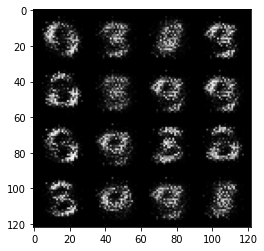

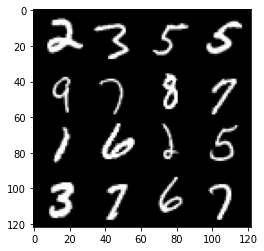

9: step 4500 / Gen loss: 5.921256438891095 / disc_loss: 0.014618310894196237


  0%|          | 0/469 [00:00<?, ?it/s]

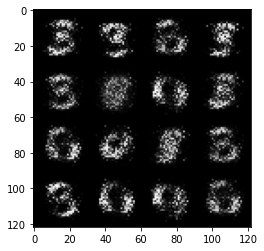

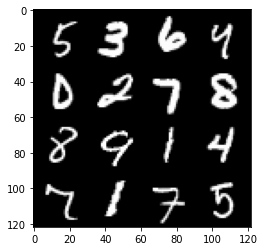

10: step 4800 / Gen loss: 6.057506384849544 / disc_loss: 0.012514289783624313


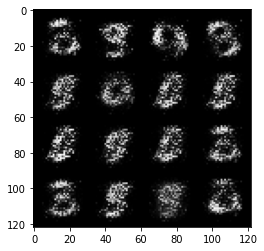

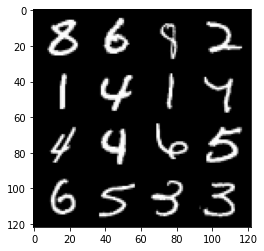

10: step 5100 / Gen loss: 6.024273805618283 / disc_loss: 0.012695831267628813


  0%|          | 0/469 [00:00<?, ?it/s]

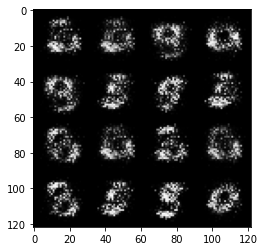

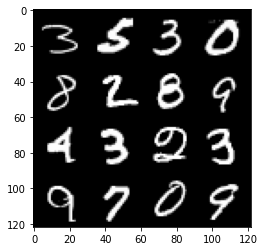

11: step 5400 / Gen loss: 6.229116581281027 / disc_loss: 0.011855289048980928


  0%|          | 0/469 [00:00<?, ?it/s]

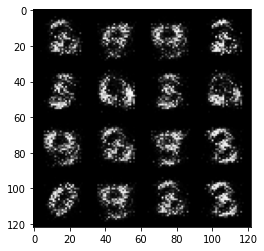

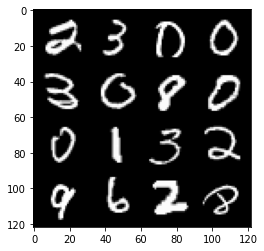

12: step 5700 / Gen loss: 6.536026879946389 / disc_loss: 0.01132550091327478


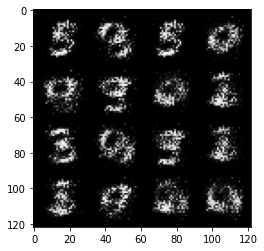

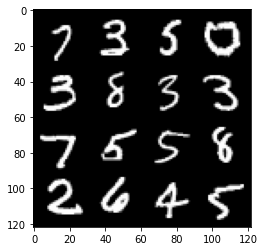

12: step 6000 / Gen loss: 6.402134923934933 / disc_loss: 0.0112099566985853


  0%|          | 0/469 [00:00<?, ?it/s]

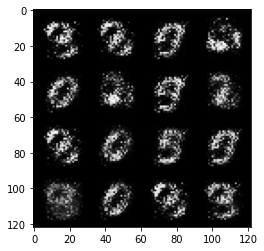

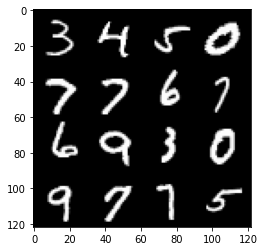

13: step 6300 / Gen loss: 6.590736789703369 / disc_loss: 0.009790876192661618


  0%|          | 0/469 [00:00<?, ?it/s]

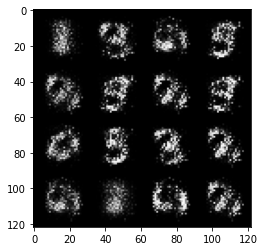

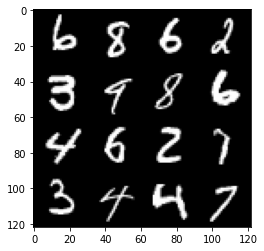

14: step 6600 / Gen loss: 6.897419929504397 / disc_loss: 0.010530322633373227


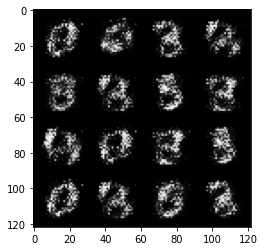

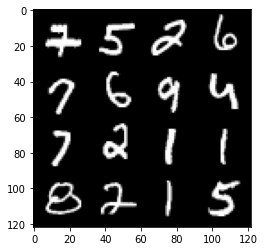

14: step 6900 / Gen loss: 6.829022784233093 / disc_loss: 0.01138288283565392


  0%|          | 0/469 [00:00<?, ?it/s]

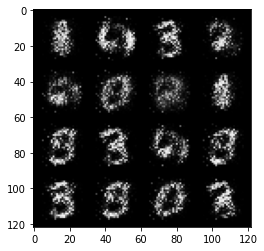

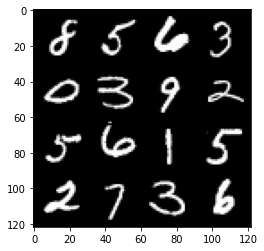

15: step 7200 / Gen loss: 6.667075430552161 / disc_loss: 0.010308983159096282


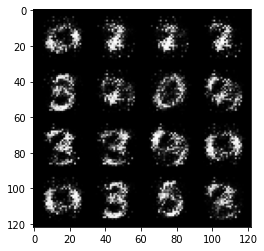

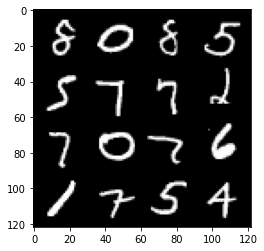

15: step 7500 / Gen loss: 6.826521959304802 / disc_loss: 0.01178133118199184


  0%|          | 0/469 [00:00<?, ?it/s]

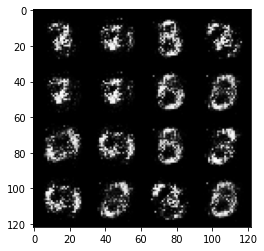

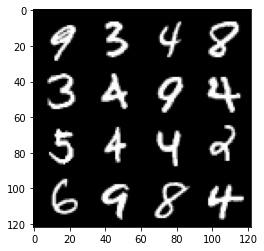

16: step 7800 / Gen loss: 7.159110074043268 / disc_loss: 0.01058398290770128


  0%|          | 0/469 [00:00<?, ?it/s]

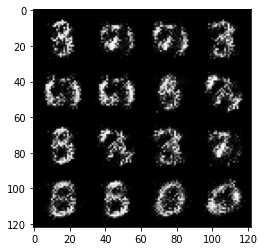

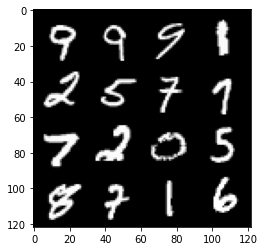

17: step 8100 / Gen loss: 7.041980703671767 / disc_loss: 0.010550928670757754


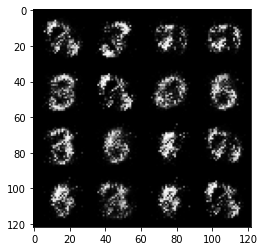

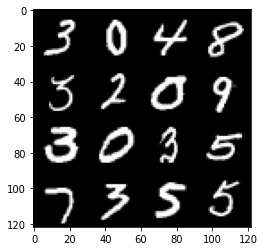

17: step 8400 / Gen loss: 7.147890477180482 / disc_loss: 0.009354034064648046


  0%|          | 0/469 [00:00<?, ?it/s]

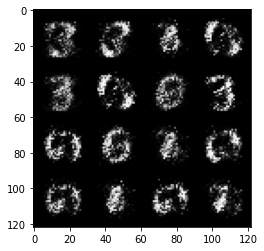

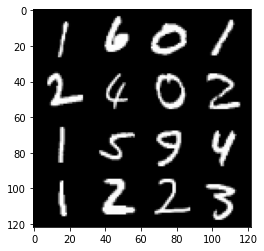

18: step 8700 / Gen loss: 7.6477895816167125 / disc_loss: 0.009043272179551424


  0%|          | 0/469 [00:00<?, ?it/s]

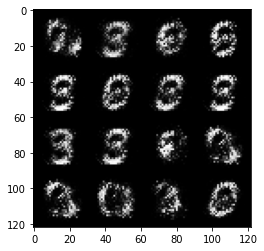

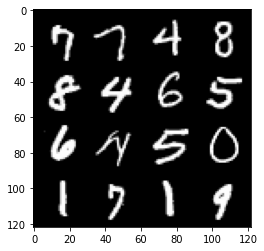

19: step 9000 / Gen loss: 7.751650176048273 / disc_loss: 0.011766763133152072


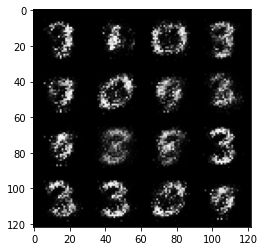

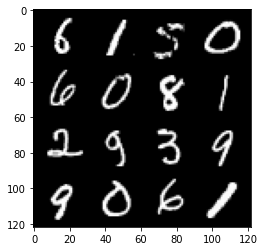

19: step 9300 / Gen loss: 7.6465257024765 / disc_loss: 0.011220276975072914


  0%|          | 0/469 [00:00<?, ?it/s]

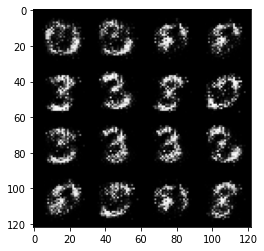

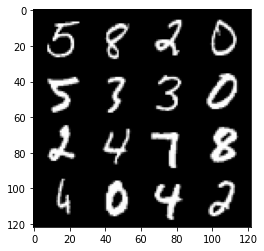

20: step 9600 / Gen loss: 7.079997269312537 / disc_loss: 0.01198383828625083


  0%|          | 0/469 [00:00<?, ?it/s]

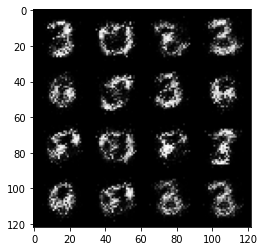

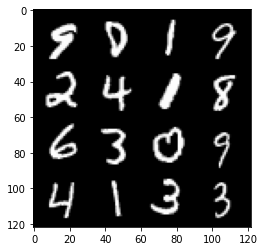

21: step 9900 / Gen loss: 6.875220893224083 / disc_loss: 0.012288894153510529


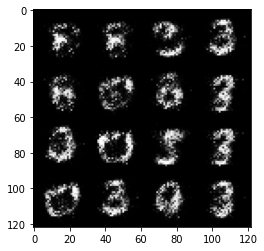

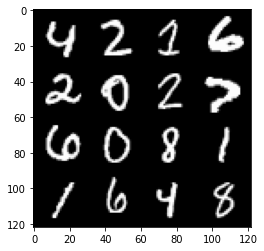

21: step 10200 / Gen loss: 6.927703116734825 / disc_loss: 0.01310114386957138


  0%|          | 0/469 [00:00<?, ?it/s]

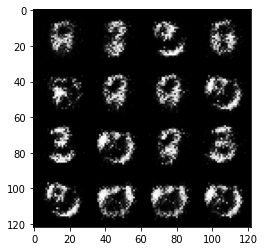

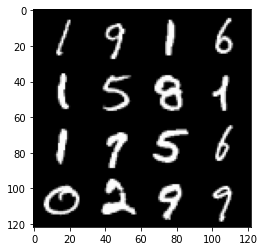

22: step 10500 / Gen loss: 6.680019896825155 / disc_loss: 0.013353303448141852


  0%|          | 0/469 [00:00<?, ?it/s]

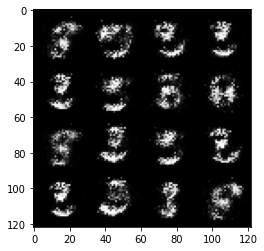

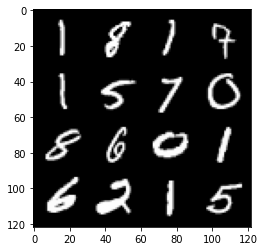

23: step 10800 / Gen loss: 6.923129947980244 / disc_loss: 0.011370987561919425


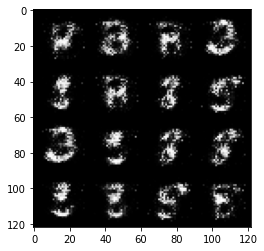

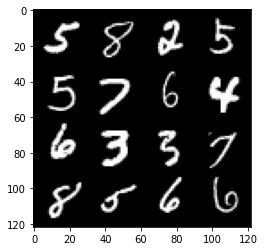

23: step 11100 / Gen loss: 6.819934018452966 / disc_loss: 0.009499657728010797


  0%|          | 0/469 [00:00<?, ?it/s]

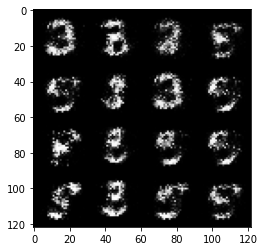

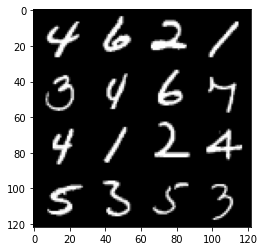

24: step 11400 / Gen loss: 7.064318253199262 / disc_loss: 0.008714874587021774


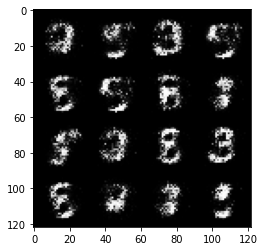

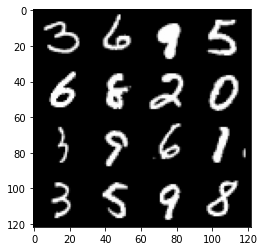

24: step 11700 / Gen loss: 6.957859888076784 / disc_loss: 0.010422782276291405


  0%|          | 0/469 [00:00<?, ?it/s]

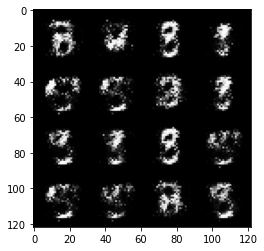

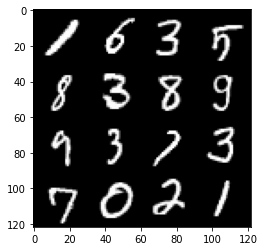

25: step 12000 / Gen loss: 7.081415899594622 / disc_loss: 0.010149778316263106


  0%|          | 0/469 [00:00<?, ?it/s]

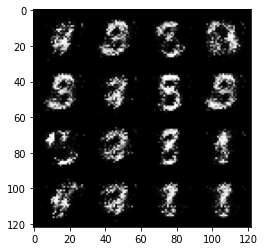

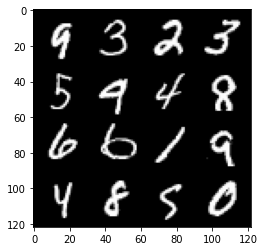

26: step 12300 / Gen loss: 7.012495738665261 / disc_loss: 0.0095333154014467


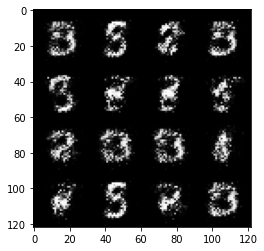

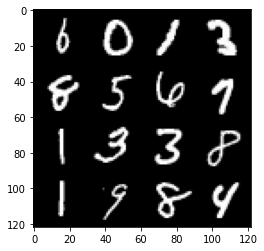

26: step 12600 / Gen loss: 7.111137576103207 / disc_loss: 0.009687127715442327


  0%|          | 0/469 [00:00<?, ?it/s]

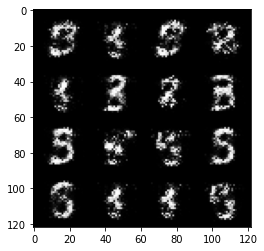

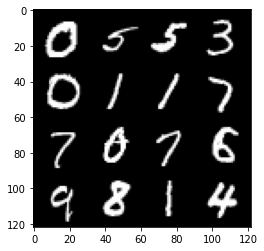

27: step 12900 / Gen loss: 6.778209624290466 / disc_loss: 0.011669829010497785


  0%|          | 0/469 [00:00<?, ?it/s]

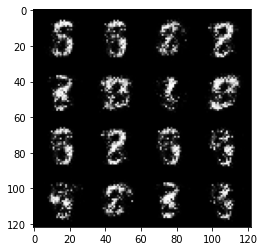

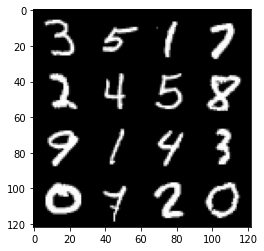

28: step 13200 / Gen loss: 6.477539769808454 / disc_loss: 0.012111544887690489


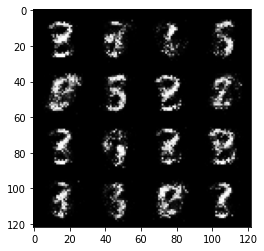

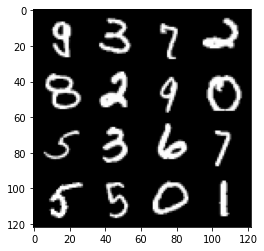

28: step 13500 / Gen loss: 7.303686498006186 / disc_loss: 0.014937802555505178


  0%|          | 0/469 [00:00<?, ?it/s]

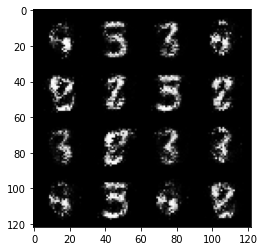

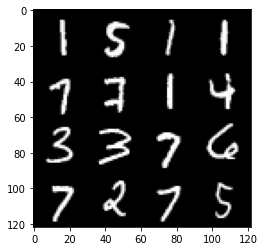

29: step 13800 / Gen loss: 6.962967265446984 / disc_loss: 0.019403957779674477


  0%|          | 0/469 [00:00<?, ?it/s]

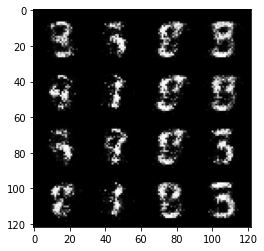

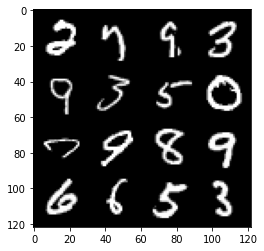

30: step 14100 / Gen loss: 6.396174699465439 / disc_loss: 0.019299443838341774


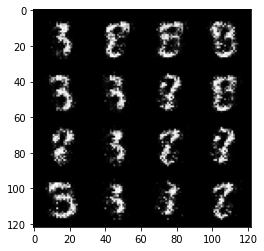

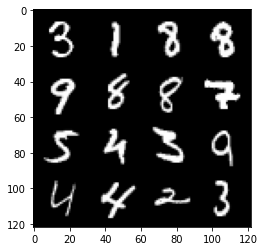

30: step 14400 / Gen loss: 6.243536297480265 / disc_loss: 0.01696273389738053


  0%|          | 0/469 [00:00<?, ?it/s]

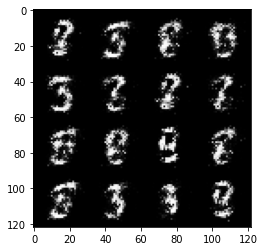

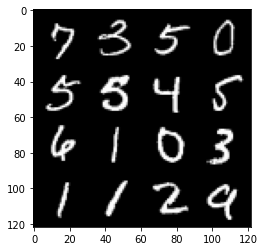

31: step 14700 / Gen loss: 6.748869457244871 / disc_loss: 0.014558776573976504


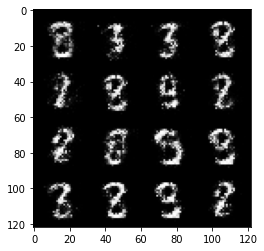

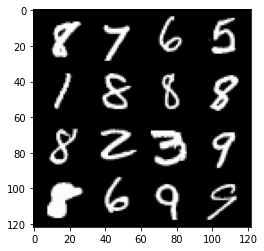

31: step 15000 / Gen loss: 6.8210634740193665 / disc_loss: 0.017126559373767426


  0%|          | 0/469 [00:00<?, ?it/s]

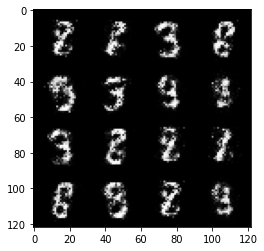

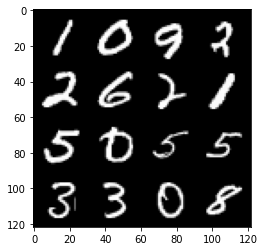

32: step 15300 / Gen loss: 6.684174818992608 / disc_loss: 0.022317568736616517


  0%|          | 0/469 [00:00<?, ?it/s]

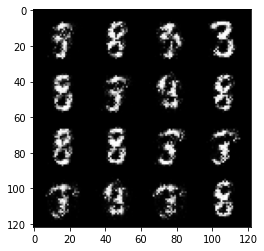

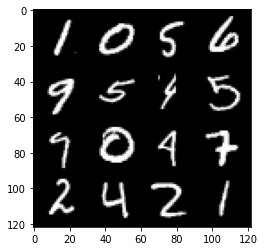

33: step 15600 / Gen loss: 6.087358104387917 / disc_loss: 0.027125553965258103


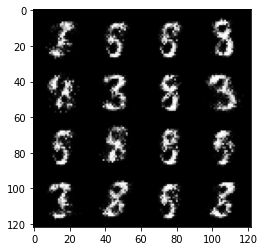

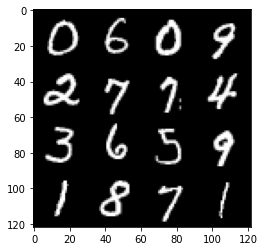

33: step 15900 / Gen loss: 5.967831939061485 / disc_loss: 0.026386373008911813


  0%|          | 0/469 [00:00<?, ?it/s]

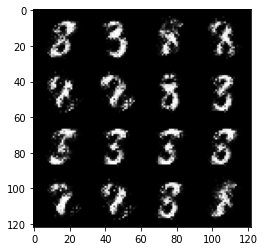

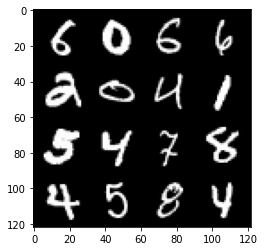

34: step 16200 / Gen loss: 6.036379065513609 / disc_loss: 0.030194322685711098


  0%|          | 0/469 [00:00<?, ?it/s]

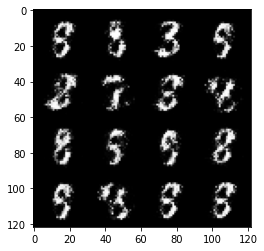

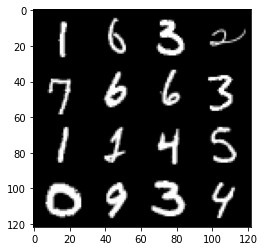

35: step 16500 / Gen loss: 6.128290432294208 / disc_loss: 0.026679896558634925


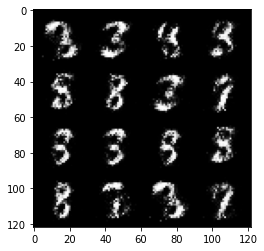

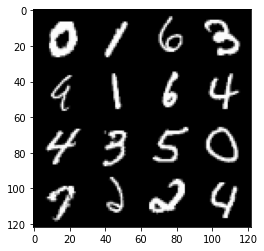

35: step 16800 / Gen loss: 6.380320723851516 / disc_loss: 0.023133177132500987


  0%|          | 0/469 [00:00<?, ?it/s]

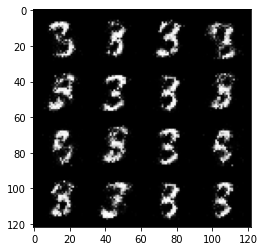

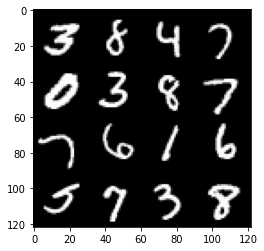

36: step 17100 / Gen loss: 6.1891884946823135 / disc_loss: 0.022768289162777355


  0%|          | 0/469 [00:00<?, ?it/s]

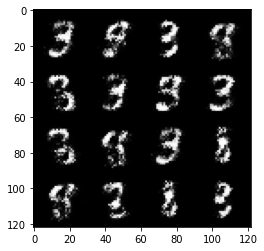

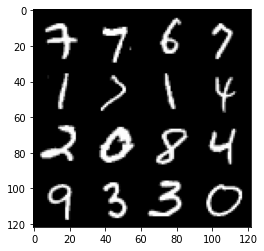

37: step 17400 / Gen loss: 6.219559930165606 / disc_loss: 0.027501012353847425


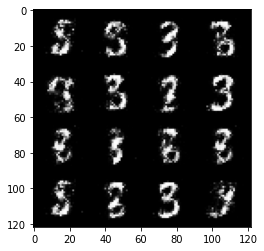

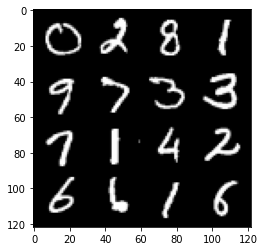

37: step 17700 / Gen loss: 6.030603419939681 / disc_loss: 0.03581654177668189


  0%|          | 0/469 [00:00<?, ?it/s]

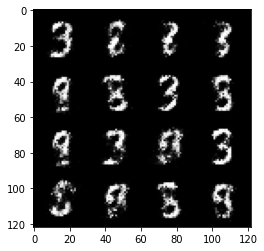

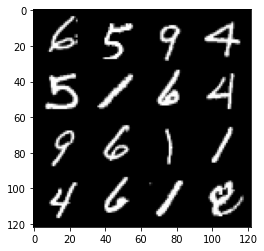

38: step 18000 / Gen loss: 5.893346234957371 / disc_loss: 0.030284032019165665


  0%|          | 0/469 [00:00<?, ?it/s]

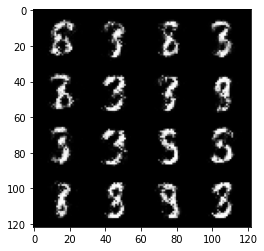

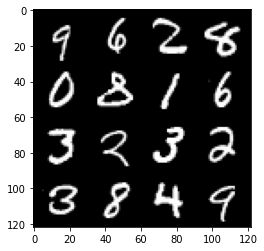

39: step 18300 / Gen loss: 5.903823493321733 / disc_loss: 0.03190197942468027


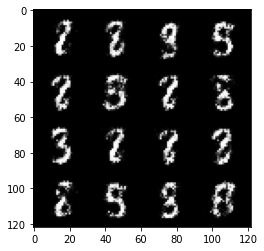

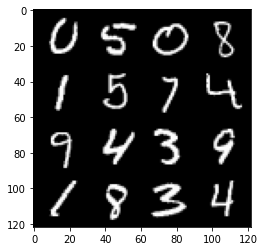

39: step 18600 / Gen loss: 5.675669180552163 / disc_loss: 0.03635648253373802


  0%|          | 0/469 [00:00<?, ?it/s]

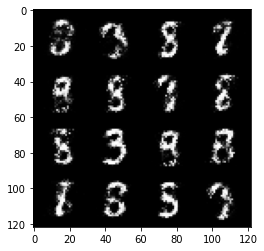

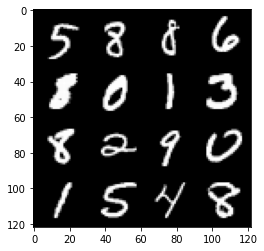

40: step 18900 / Gen loss: 5.875788439114882 / disc_loss: 0.028990339497104292


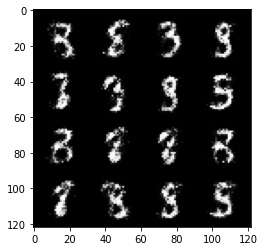

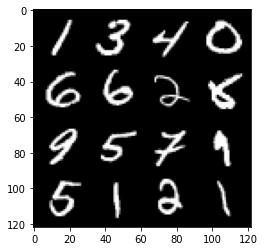

40: step 19200 / Gen loss: 5.974864123662314 / disc_loss: 0.03934489297990997


  0%|          | 0/469 [00:00<?, ?it/s]

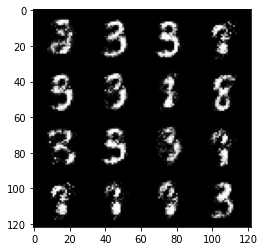

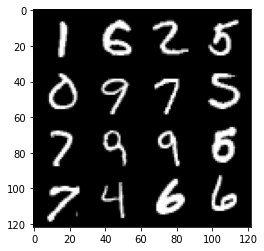

41: step 19500 / Gen loss: 5.822273562749224 / disc_loss: 0.04414754036503533


  0%|          | 0/469 [00:00<?, ?it/s]

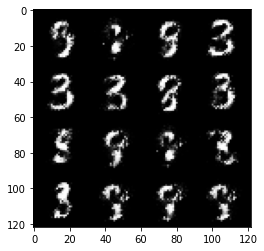

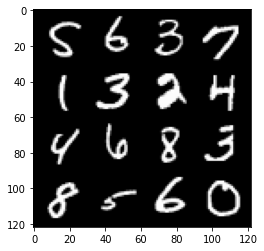

42: step 19800 / Gen loss: 5.704111627737682 / disc_loss: 0.05001204200399423


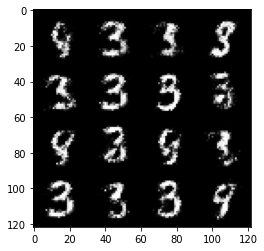

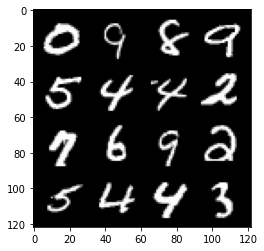

42: step 20100 / Gen loss: 5.554772783915197 / disc_loss: 0.042832996395106106


  0%|          | 0/469 [00:00<?, ?it/s]

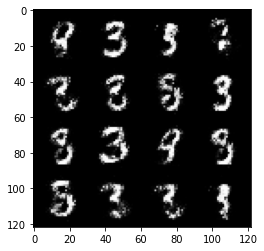

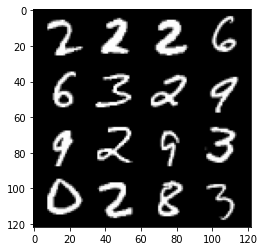

43: step 20400 / Gen loss: 5.731470861434934 / disc_loss: 0.04478851656429468


  0%|          | 0/469 [00:00<?, ?it/s]

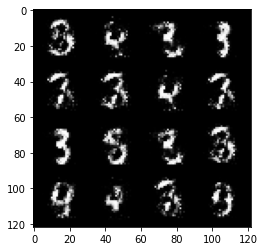

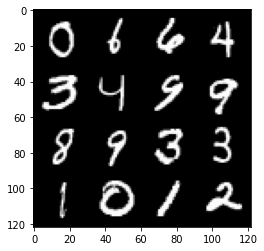

44: step 20700 / Gen loss: 5.535065937042237 / disc_loss: 0.043125401362776775


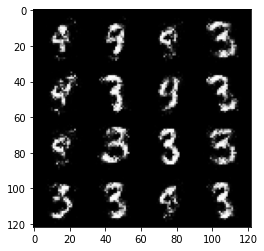

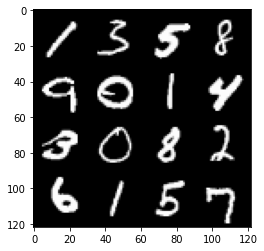

44: step 21000 / Gen loss: 5.739822276433307 / disc_loss: 0.04296630702291929


  0%|          | 0/469 [00:00<?, ?it/s]

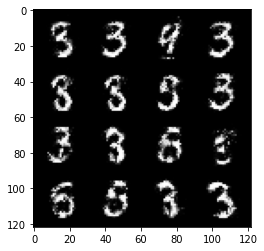

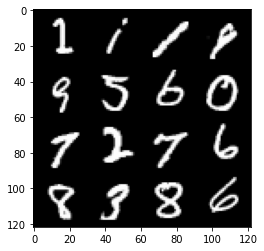

45: step 21300 / Gen loss: 5.421130984624229 / disc_loss: 0.05716576439638926


  0%|          | 0/469 [00:00<?, ?it/s]

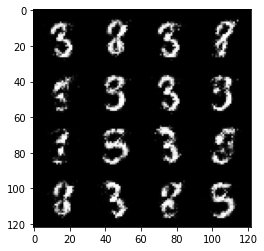

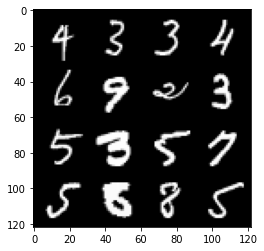

46: step 21600 / Gen loss: 5.238286760648095 / disc_loss: 0.05444580302884182


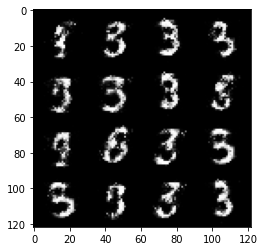

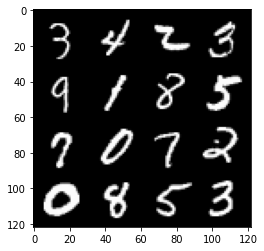

46: step 21900 / Gen loss: 5.3584479300181105 / disc_loss: 0.04897656338289382


  0%|          | 0/469 [00:00<?, ?it/s]

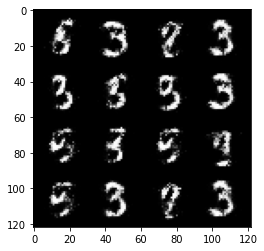

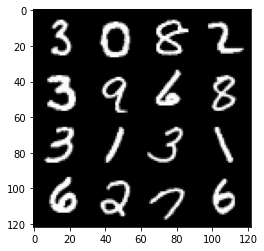

47: step 22200 / Gen loss: 5.242023684183752 / disc_loss: 0.05307540459558371


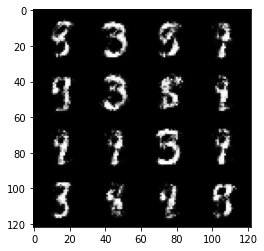

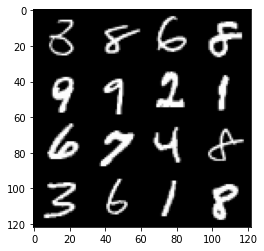

47: step 22500 / Gen loss: 5.0559279449780785 / disc_loss: 0.06702744957680501


  0%|          | 0/469 [00:00<?, ?it/s]

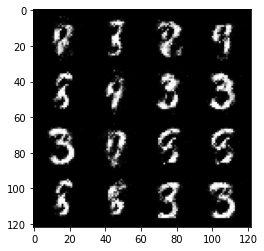

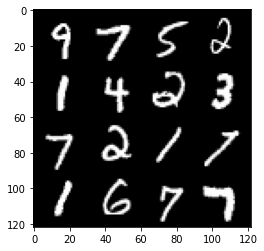

48: step 22800 / Gen loss: 5.1202244536082 / disc_loss: 0.05651172374996045


  0%|          | 0/469 [00:00<?, ?it/s]

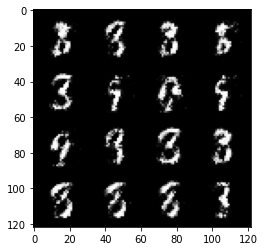

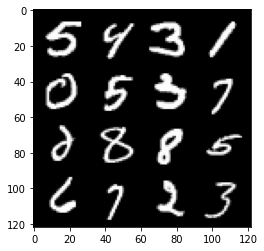

49: step 23100 / Gen loss: 5.4101207280159 / disc_loss: 0.05633195022121072


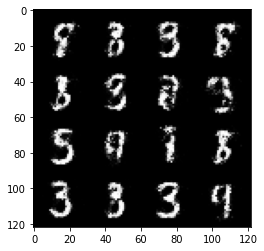

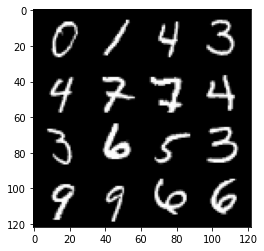

49: step 23400 / Gen loss: 5.43622776508331 / disc_loss: 0.056327476765339585


  0%|          | 0/469 [00:00<?, ?it/s]

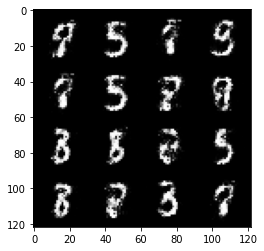

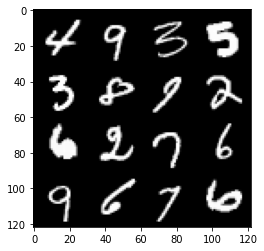

50: step 23700 / Gen loss: 4.7838822984695435 / disc_loss: 0.06742573322417832


  0%|          | 0/469 [00:00<?, ?it/s]

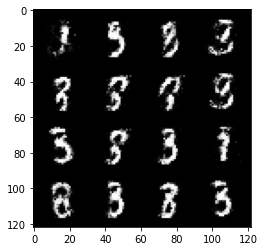

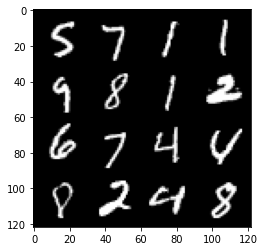

51: step 24000 / Gen loss: 4.822739109198251 / disc_loss: 0.07213759534060958


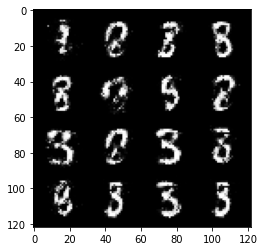

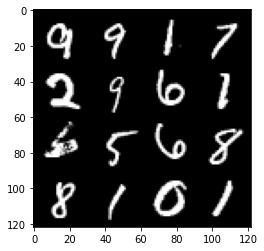

51: step 24300 / Gen loss: 4.82561726172765 / disc_loss: 0.0625875252919893


  0%|          | 0/469 [00:00<?, ?it/s]

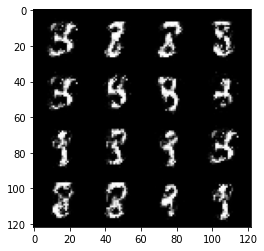

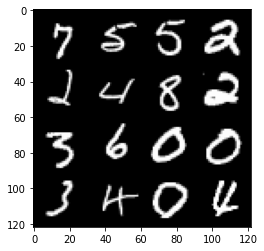

52: step 24600 / Gen loss: 4.703454998334248 / disc_loss: 0.06959348225345219


  0%|          | 0/469 [00:00<?, ?it/s]

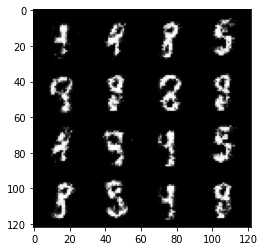

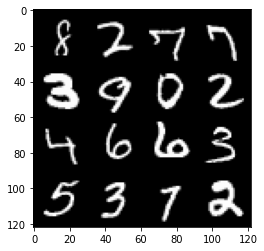

53: step 24900 / Gen loss: 4.872880595525108 / disc_loss: 0.06771973697468632


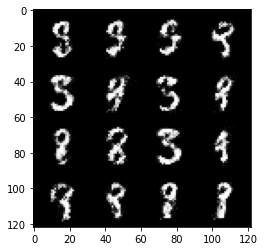

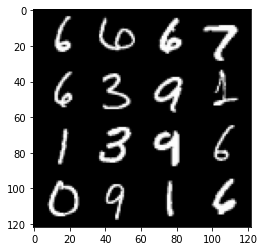

53: step 25200 / Gen loss: 4.8833544977506005 / disc_loss: 0.06236367058629792


  0%|          | 0/469 [00:00<?, ?it/s]

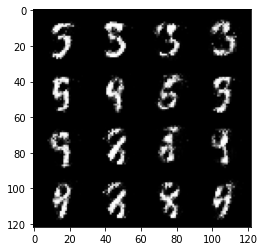

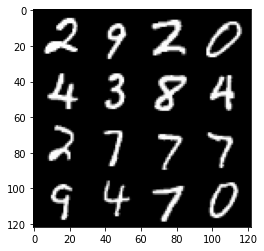

54: step 25500 / Gen loss: 4.8748338858286555 / disc_loss: 0.06935707592715823


  0%|          | 0/469 [00:00<?, ?it/s]

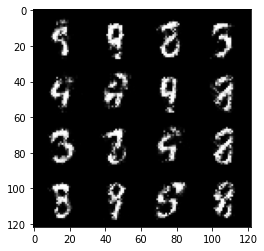

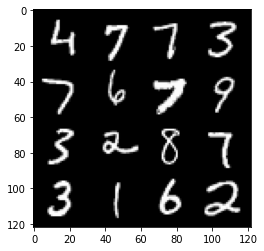

55: step 25800 / Gen loss: 4.756694171428681 / disc_loss: 0.07008028846544524


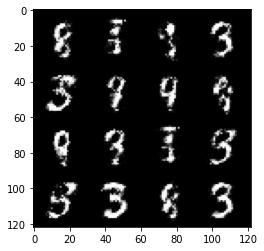

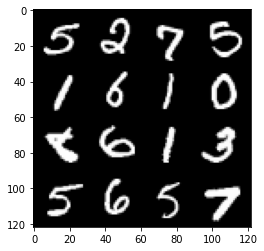

55: step 26100 / Gen loss: 4.90096407572428 / disc_loss: 0.07091977323095003


  0%|          | 0/469 [00:00<?, ?it/s]

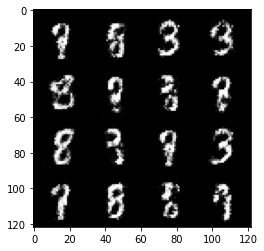

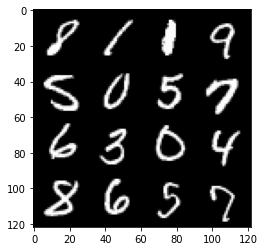

56: step 26400 / Gen loss: 4.765916313330335 / disc_loss: 0.08370335380236313


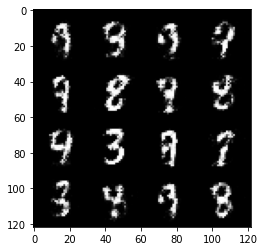

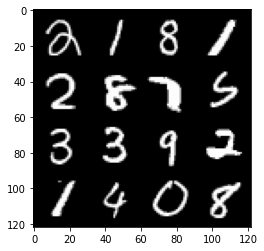

56: step 26700 / Gen loss: 4.417771942615511 / disc_loss: 0.10346624461313092


  0%|          | 0/469 [00:00<?, ?it/s]

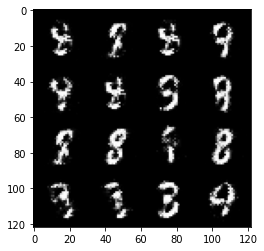

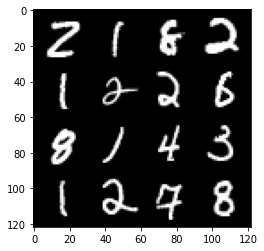

57: step 27000 / Gen loss: 4.430826501846312 / disc_loss: 0.08825528175880513


  0%|          | 0/469 [00:00<?, ?it/s]

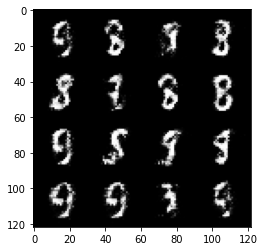

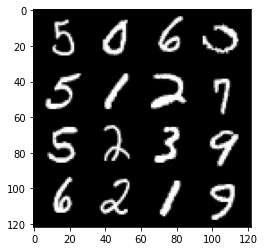

58: step 27300 / Gen loss: 4.401995895703634 / disc_loss: 0.09476756419986489


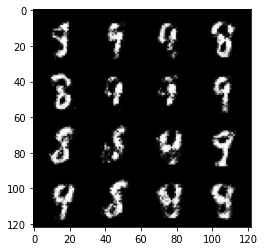

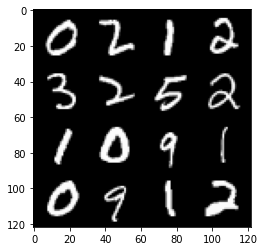

58: step 27600 / Gen loss: 4.246408260663351 / disc_loss: 0.09969022676969572


  0%|          | 0/469 [00:00<?, ?it/s]

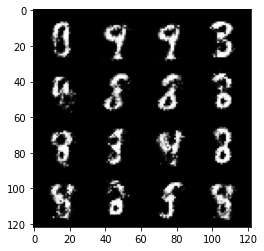

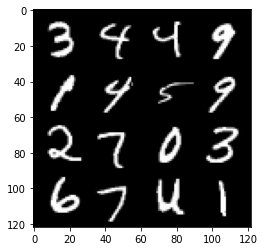

59: step 27900 / Gen loss: 4.492751371860504 / disc_loss: 0.07924254001428684


  0%|          | 0/469 [00:00<?, ?it/s]

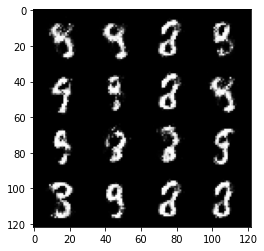

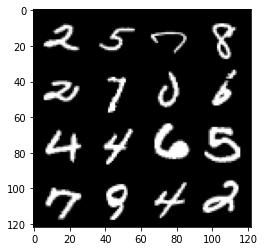

60: step 28200 / Gen loss: 4.659553113778433 / disc_loss: 0.08356761894499265


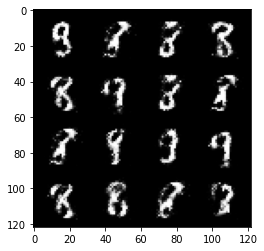

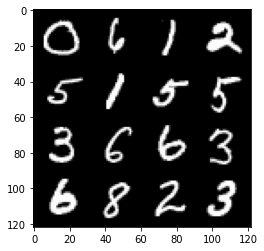

60: step 28500 / Gen loss: 4.386200449466705 / disc_loss: 0.08994180834541722


  0%|          | 0/469 [00:00<?, ?it/s]

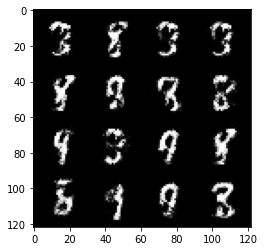

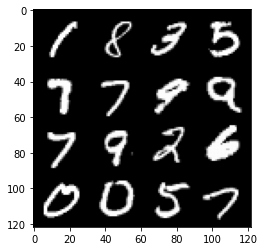

61: step 28800 / Gen loss: 4.4936394286155705 / disc_loss: 0.08871489727248749


  0%|          | 0/469 [00:00<?, ?it/s]

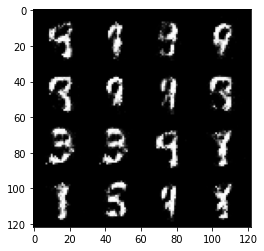

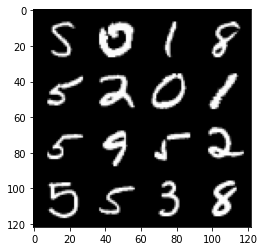

62: step 29100 / Gen loss: 4.307912566661833 / disc_loss: 0.09513618381073076


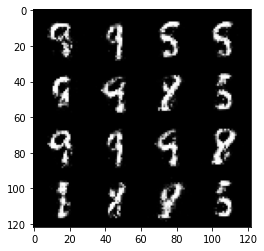

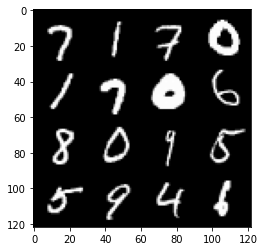

62: step 29400 / Gen loss: 4.059377495447795 / disc_loss: 0.09178067308540146


  0%|          | 0/469 [00:00<?, ?it/s]

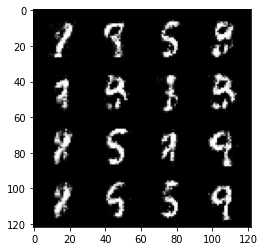

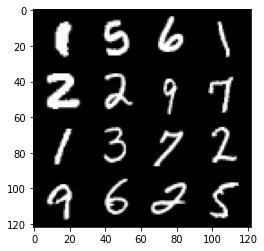

63: step 29700 / Gen loss: 4.208075505097709 / disc_loss: 0.08622301402812203


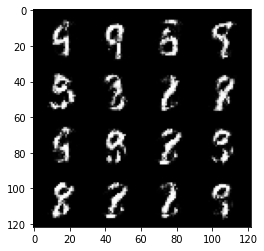

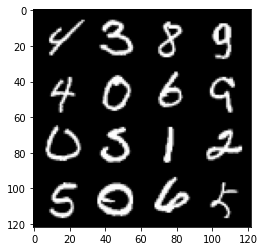

63: step 30000 / Gen loss: 4.250879159768421 / disc_loss: 0.08538916590313123


  0%|          | 0/469 [00:00<?, ?it/s]

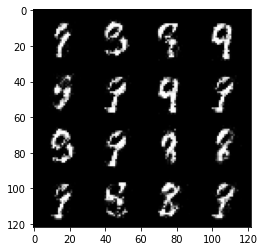

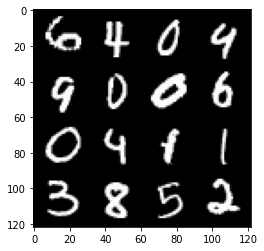

64: step 30300 / Gen loss: 4.072629771232604 / disc_loss: 0.08852119892835618


  0%|          | 0/469 [00:00<?, ?it/s]

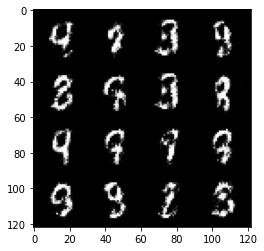

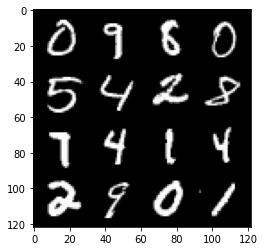

65: step 30600 / Gen loss: 4.229607293605806 / disc_loss: 0.09059880013888084


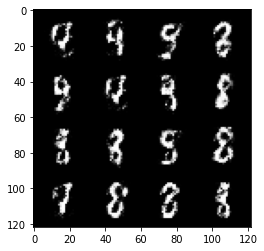

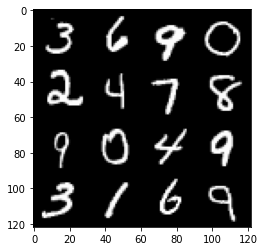

65: step 30900 / Gen loss: 4.078381291230521 / disc_loss: 0.10258025936782358


  0%|          | 0/469 [00:00<?, ?it/s]

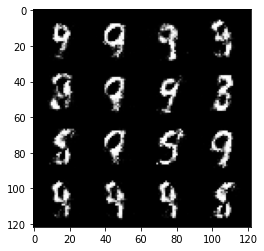

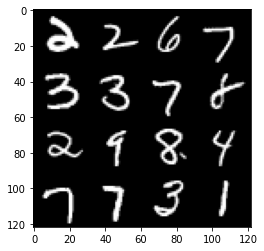

66: step 31200 / Gen loss: 4.117028219699861 / disc_loss: 0.09563482652107864


  0%|          | 0/469 [00:00<?, ?it/s]

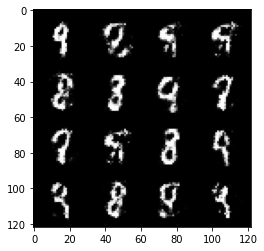

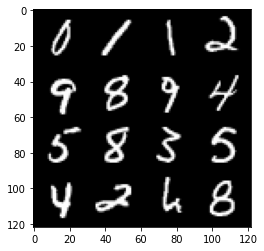

67: step 31500 / Gen loss: 4.1908628471692415 / disc_loss: 0.09372722567369536


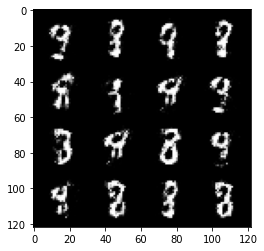

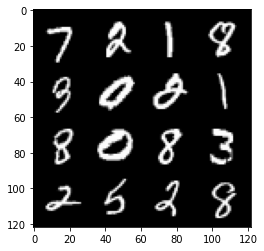

67: step 31800 / Gen loss: 4.064028055667878 / disc_loss: 0.10372926263759528


  0%|          | 0/469 [00:00<?, ?it/s]

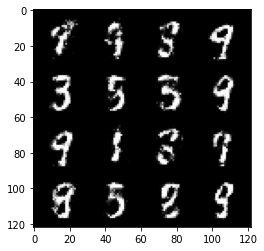

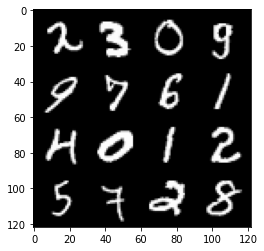

68: step 32100 / Gen loss: 3.9638854749997448 / disc_loss: 0.10813811171799904


  0%|          | 0/469 [00:00<?, ?it/s]

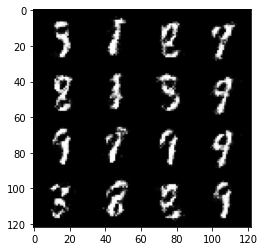

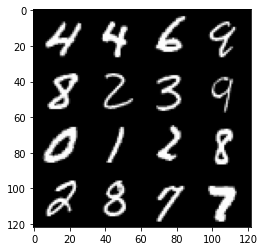

69: step 32400 / Gen loss: 3.899757716655732 / disc_loss: 0.10981023718913394


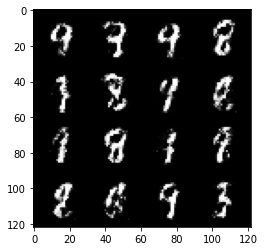

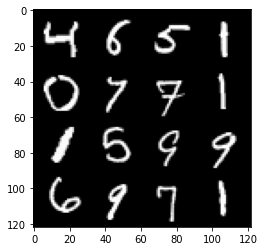

69: step 32700 / Gen loss: 4.018330190181734 / disc_loss: 0.10904729789743825


  0%|          | 0/469 [00:00<?, ?it/s]

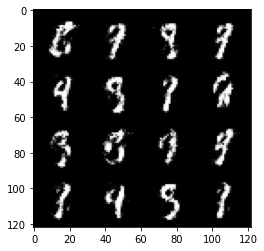

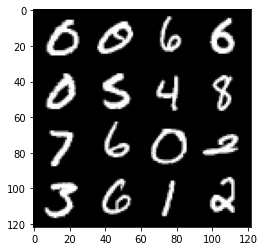

70: step 33000 / Gen loss: 3.9590947429339063 / disc_loss: 0.10896007476995376


  0%|          | 0/469 [00:00<?, ?it/s]

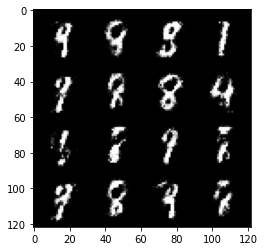

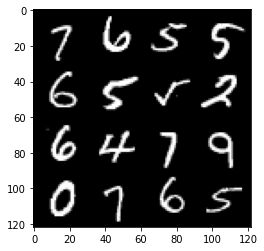

71: step 33300 / Gen loss: 4.144225167433423 / disc_loss: 0.09771961140135926


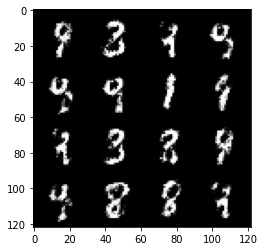

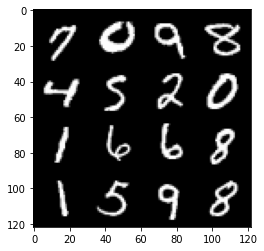

71: step 33600 / Gen loss: 3.903433939615885 / disc_loss: 0.12029613794138037


  0%|          | 0/469 [00:00<?, ?it/s]

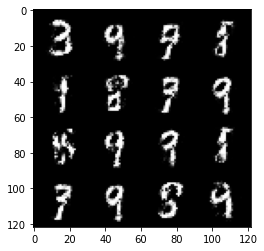

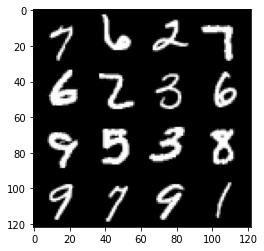

72: step 33900 / Gen loss: 3.802539321581524 / disc_loss: 0.12770360437532274


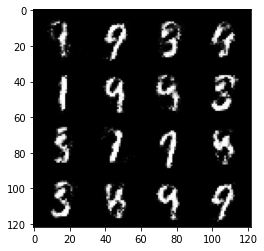

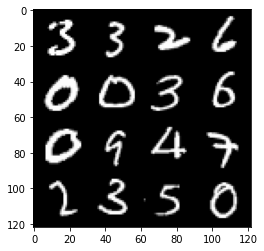

72: step 34200 / Gen loss: 3.668487865130106 / disc_loss: 0.12504395903398596


  0%|          | 0/469 [00:00<?, ?it/s]

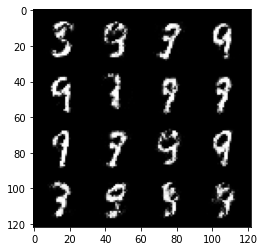

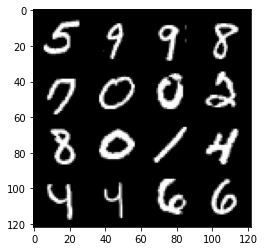

73: step 34500 / Gen loss: 3.7153743799527486 / disc_loss: 0.12640474272271002


  0%|          | 0/469 [00:00<?, ?it/s]

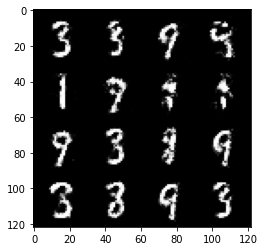

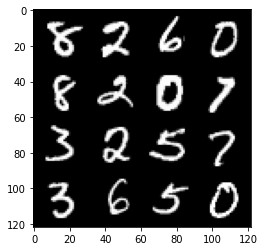

74: step 34800 / Gen loss: 3.6855219602584812 / disc_loss: 0.12462117575109005


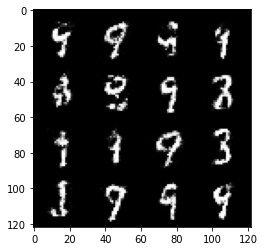

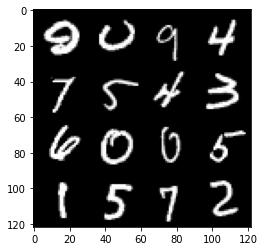

74: step 35100 / Gen loss: 3.710374359289804 / disc_loss: 0.11032767863323294


  0%|          | 0/469 [00:00<?, ?it/s]

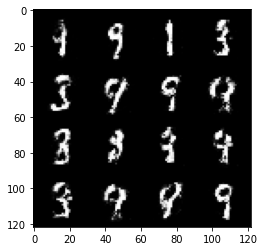

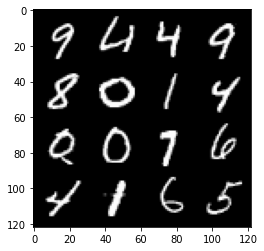

75: step 35400 / Gen loss: 3.7155650226275156 / disc_loss: 0.12089066234727704


  0%|          | 0/469 [00:00<?, ?it/s]

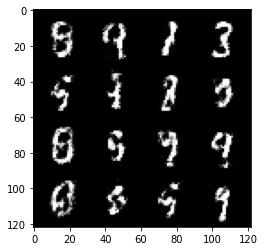

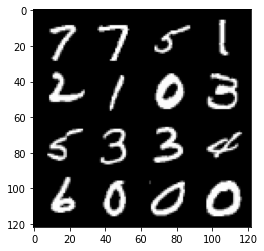

76: step 35700 / Gen loss: 3.64783422311147 / disc_loss: 0.1352384321391582


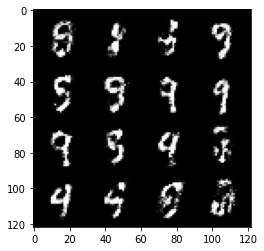

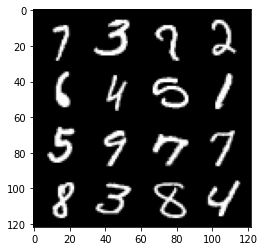

76: step 36000 / Gen loss: 3.5708468127250654 / disc_loss: 0.13038931804398693


  0%|          | 0/469 [00:00<?, ?it/s]

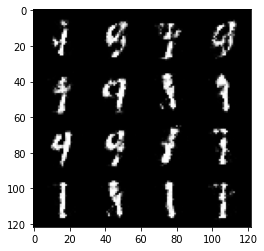

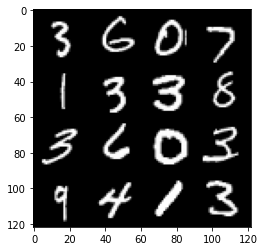

77: step 36300 / Gen loss: 3.5088048545519515 / disc_loss: 0.1443220076958339


  0%|          | 0/469 [00:00<?, ?it/s]

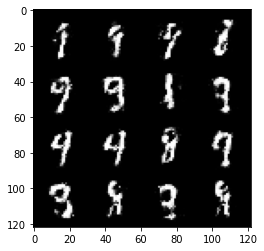

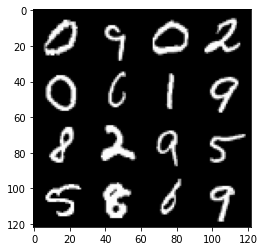

78: step 36600 / Gen loss: 3.4449046985308325 / disc_loss: 0.13840063090125726


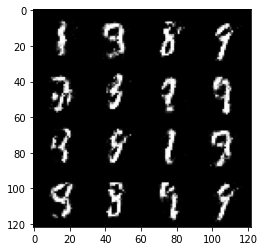

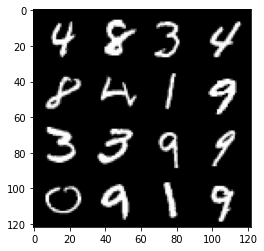

78: step 36900 / Gen loss: 3.391263327598573 / disc_loss: 0.15417283110320568


  0%|          | 0/469 [00:00<?, ?it/s]

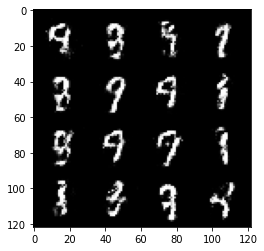

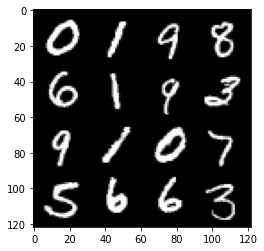

79: step 37200 / Gen loss: 3.479086304505668 / disc_loss: 0.13355988976856062


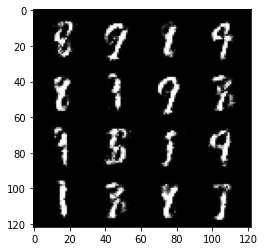

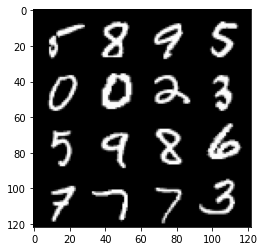

79: step 37500 / Gen loss: 3.477191737492876 / disc_loss: 0.13557256060342002


  0%|          | 0/469 [00:00<?, ?it/s]

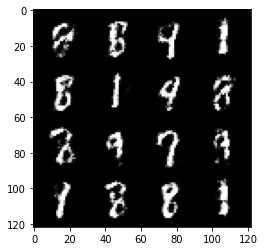

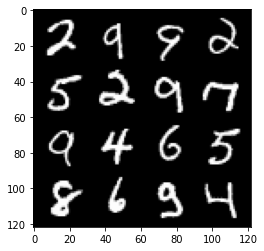

80: step 37800 / Gen loss: 3.2121020086606373 / disc_loss: 0.16103257971505316


  0%|          | 0/469 [00:00<?, ?it/s]

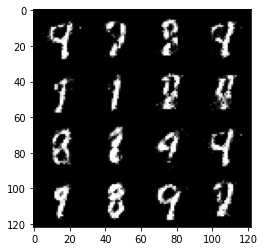

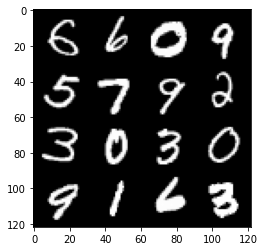

81: step 38100 / Gen loss: 3.1717991884549437 / disc_loss: 0.1704239699741204


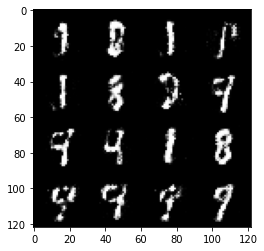

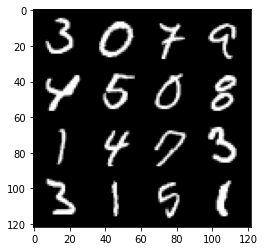

81: step 38400 / Gen loss: 3.159488024711609 / disc_loss: 0.16140405262509988


  0%|          | 0/469 [00:00<?, ?it/s]

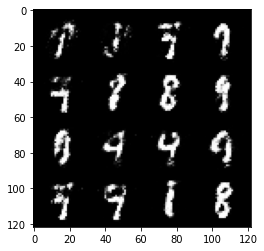

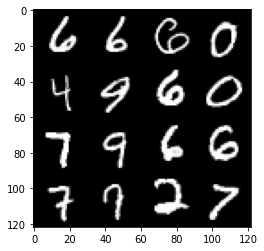

82: step 38700 / Gen loss: 3.086877988974255 / disc_loss: 0.1832059877862532


  0%|          | 0/469 [00:00<?, ?it/s]

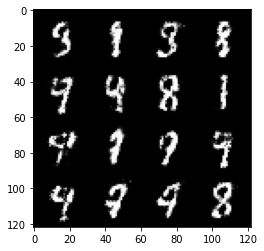

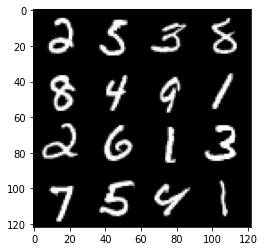

83: step 39000 / Gen loss: 3.072537144819894 / disc_loss: 0.18014236288766078


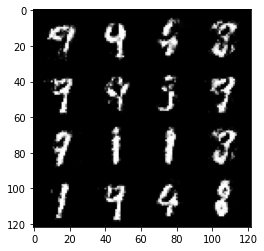

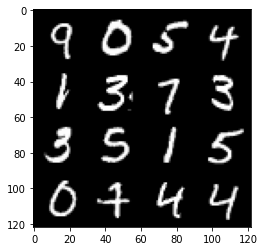

83: step 39300 / Gen loss: 2.9663298678398093 / disc_loss: 0.1884945699075858


  0%|          | 0/469 [00:00<?, ?it/s]

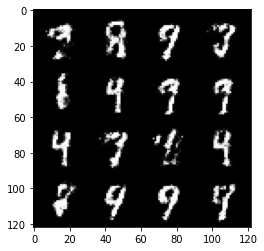

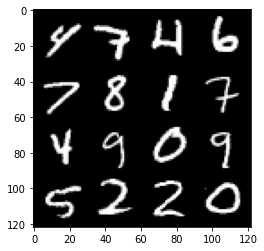

84: step 39600 / Gen loss: 3.0095192003250157 / disc_loss: 0.17349924320975935


  0%|          | 0/469 [00:00<?, ?it/s]

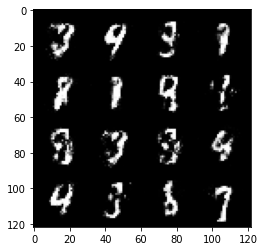

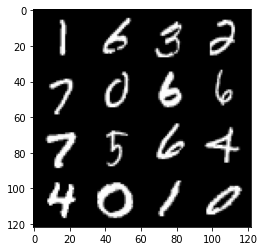

85: step 39900 / Gen loss: 3.2515835690498345 / disc_loss: 0.15199113806088765


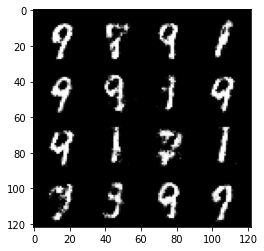

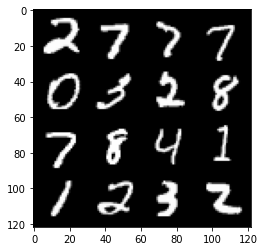

85: step 40200 / Gen loss: 3.0129489461580925 / disc_loss: 0.1851869508127373


  0%|          | 0/469 [00:00<?, ?it/s]

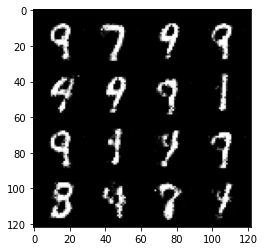

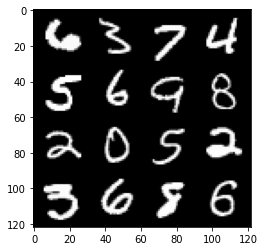

86: step 40500 / Gen loss: 2.8206401228904725 / disc_loss: 0.20712142179409668


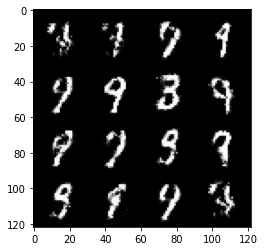

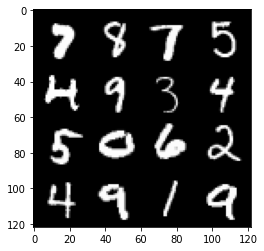

86: step 40800 / Gen loss: 2.822672041257224 / disc_loss: 0.20829090197881056


  0%|          | 0/469 [00:00<?, ?it/s]

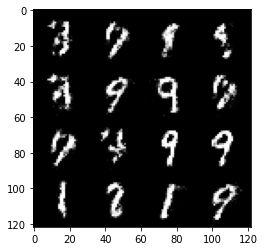

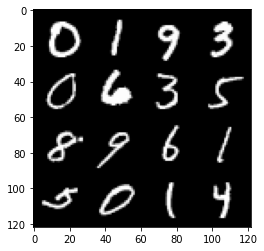

87: step 41100 / Gen loss: 2.871399660110475 / disc_loss: 0.19384570916493726


  0%|          | 0/469 [00:00<?, ?it/s]

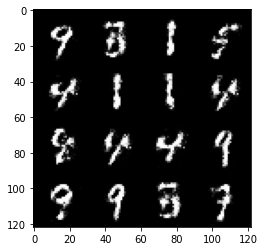

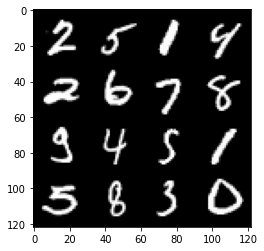

88: step 41400 / Gen loss: 2.8867685437202444 / disc_loss: 0.19076558845738578


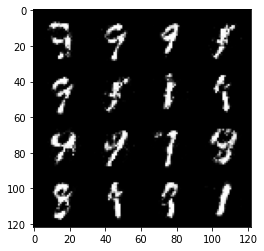

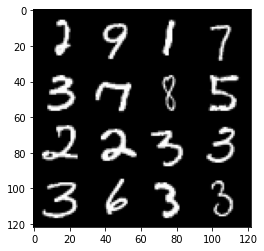

88: step 41700 / Gen loss: 2.852629968325297 / disc_loss: 0.19731251580019799


  0%|          | 0/469 [00:00<?, ?it/s]

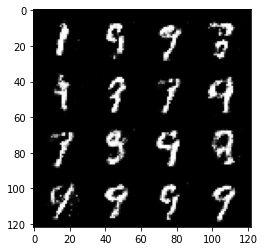

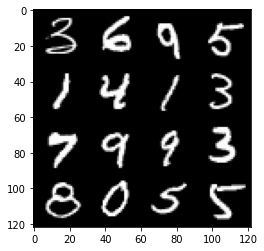

89: step 42000 / Gen loss: 2.7522020649909984 / disc_loss: 0.2147078942755858


  0%|          | 0/469 [00:00<?, ?it/s]

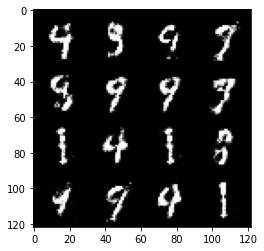

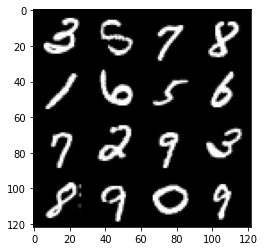

90: step 42300 / Gen loss: 2.7203766942024226 / disc_loss: 0.2149574765066306


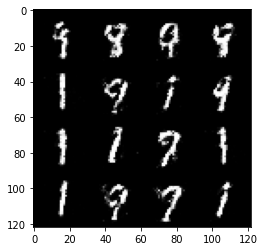

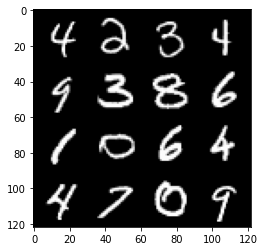

90: step 42600 / Gen loss: 2.7943122752507534 / disc_loss: 0.19777984035511817


  0%|          | 0/469 [00:00<?, ?it/s]

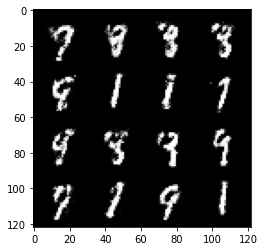

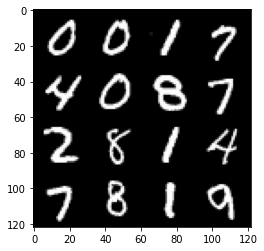

91: step 42900 / Gen loss: 2.6991259876887 / disc_loss: 0.22855189961691694


  0%|          | 0/469 [00:00<?, ?it/s]

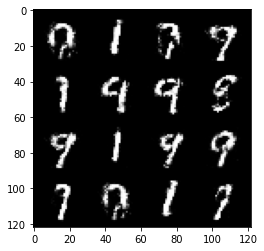

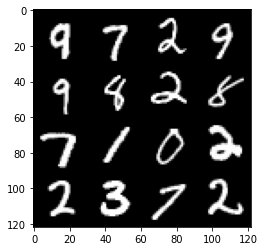

92: step 43200 / Gen loss: 2.590841478506724 / disc_loss: 0.22622340286771456


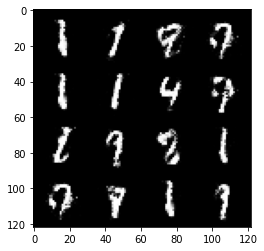

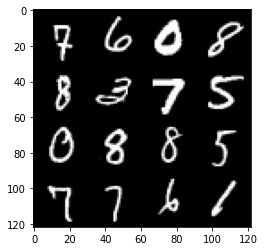

92: step 43500 / Gen loss: 2.625087645848591 / disc_loss: 0.21674768070379896


  0%|          | 0/469 [00:00<?, ?it/s]

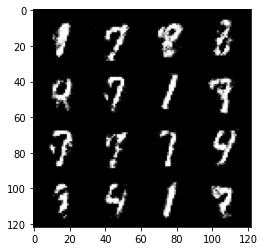

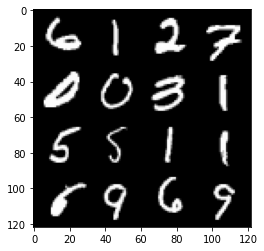

93: step 43800 / Gen loss: 2.6544432155291227 / disc_loss: 0.2259268438567717


  0%|          | 0/469 [00:00<?, ?it/s]

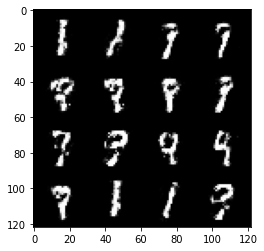

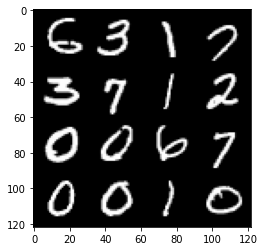

94: step 44100 / Gen loss: 2.4728985830148047 / disc_loss: 0.25074948052565255


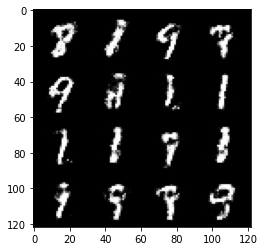

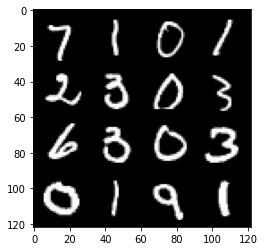

94: step 44400 / Gen loss: 2.6052423644065863 / disc_loss: 0.23015351330240583


  0%|          | 0/469 [00:00<?, ?it/s]

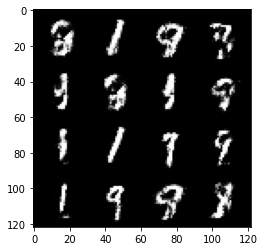

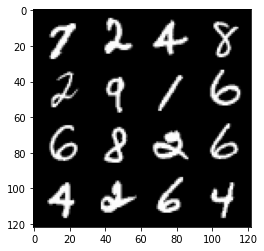

95: step 44700 / Gen loss: 2.6346490748723346 / disc_loss: 0.2200120411564907


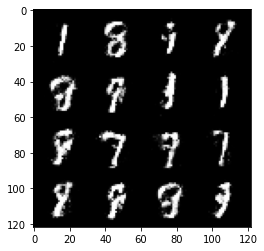

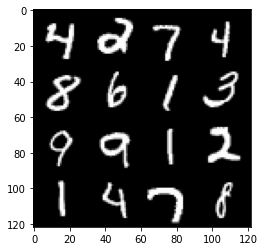

95: step 45000 / Gen loss: 2.623111650943758 / disc_loss: 0.21718433536589152


  0%|          | 0/469 [00:00<?, ?it/s]

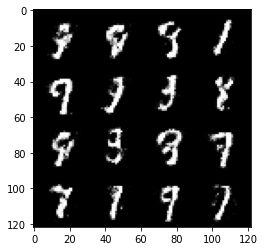

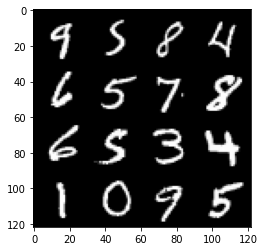

96: step 45300 / Gen loss: 2.645420656998953 / disc_loss: 0.2094114983081818


  0%|          | 0/469 [00:00<?, ?it/s]

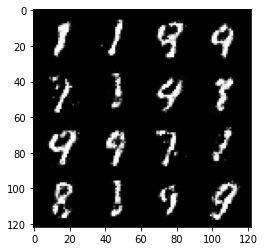

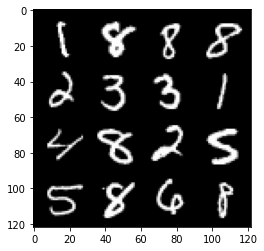

97: step 45600 / Gen loss: 2.6257801930109688 / disc_loss: 0.22178677166501687


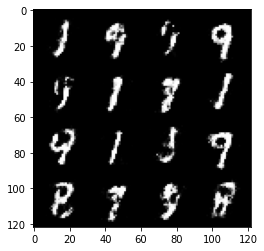

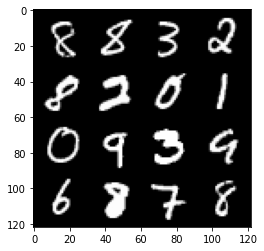

97: step 45900 / Gen loss: 2.5956031727790823 / disc_loss: 0.22090467371046543


  0%|          | 0/469 [00:00<?, ?it/s]

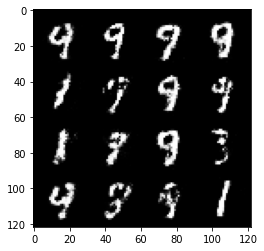

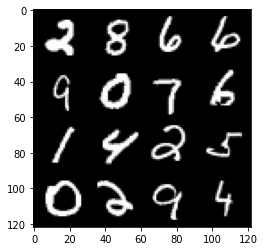

98: step 46200 / Gen loss: 2.489587654272717 / disc_loss: 0.24226676235596348


  0%|          | 0/469 [00:00<?, ?it/s]

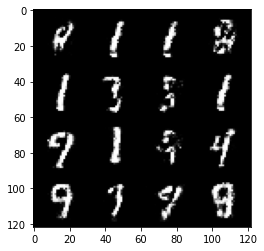

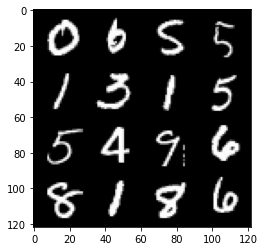

99: step 46500 / Gen loss: 2.517278709014259 / disc_loss: 0.2279036866128446


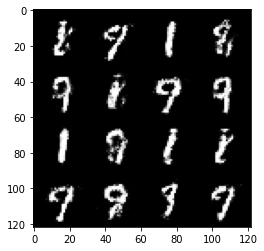

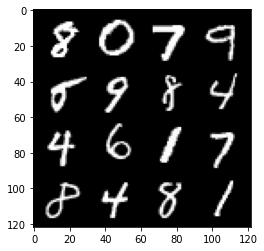

99: step 46800 / Gen loss: 2.7088779171307884 / disc_loss: 0.20087210183342302


  0%|          | 0/469 [00:00<?, ?it/s]

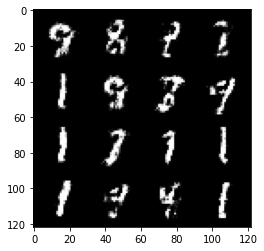

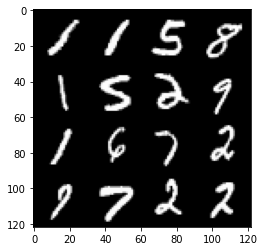

100: step 47100 / Gen loss: 2.746545394261678 / disc_loss: 0.20135247310002627


  0%|          | 0/469 [00:00<?, ?it/s]

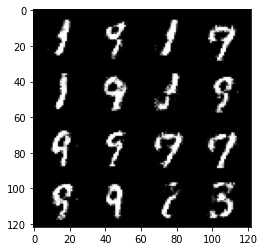

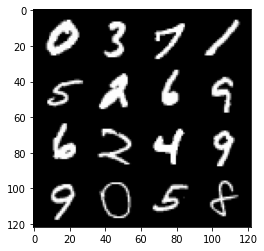

101: step 47400 / Gen loss: 2.6948261356353784 / disc_loss: 0.20818077348172662


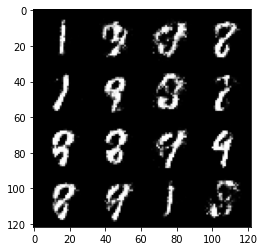

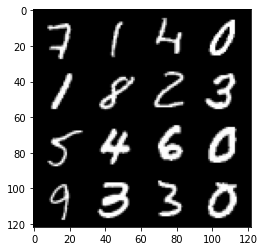

101: step 47700 / Gen loss: 2.703311582406362 / disc_loss: 0.22025313004851343


  0%|          | 0/469 [00:00<?, ?it/s]

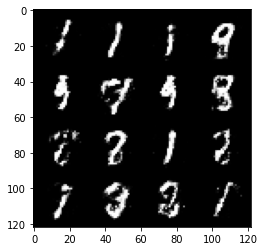

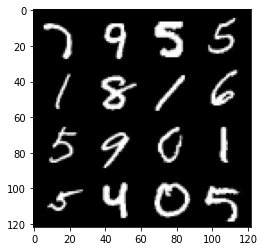

102: step 48000 / Gen loss: 2.555108799139659 / disc_loss: 0.22401792975763474


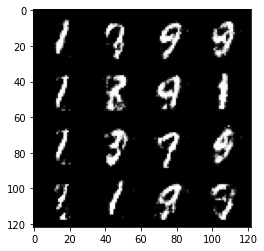

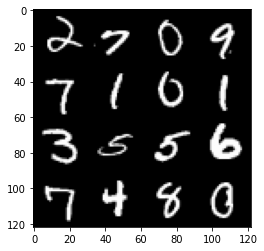

102: step 48300 / Gen loss: 2.4756692608197532 / disc_loss: 0.23877110371987034


  0%|          | 0/469 [00:00<?, ?it/s]

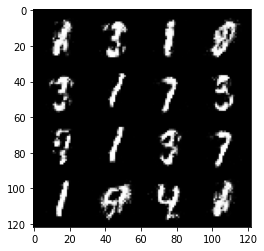

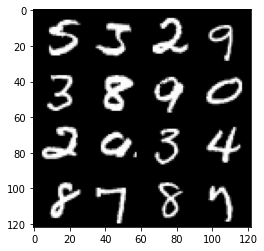

103: step 48600 / Gen loss: 2.498227509657541 / disc_loss: 0.2240310419599214


  0%|          | 0/469 [00:00<?, ?it/s]

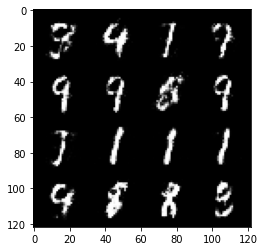

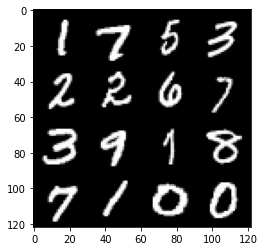

104: step 48900 / Gen loss: 2.6021826140085857 / disc_loss: 0.21117186521490403


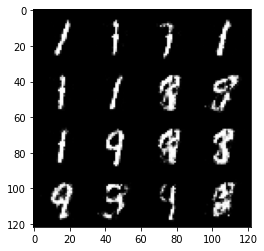

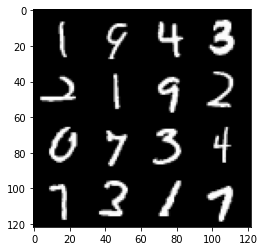

104: step 49200 / Gen loss: 2.4890047442913046 / disc_loss: 0.22427935774127652


  0%|          | 0/469 [00:00<?, ?it/s]

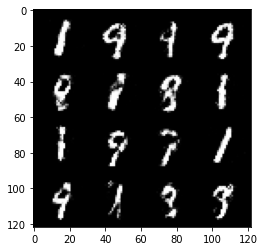

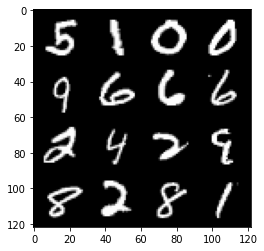

105: step 49500 / Gen loss: 2.521421088377636 / disc_loss: 0.22689712598919856


  0%|          | 0/469 [00:00<?, ?it/s]

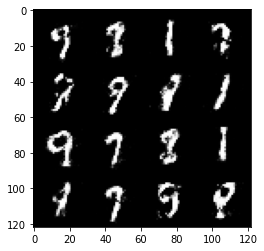

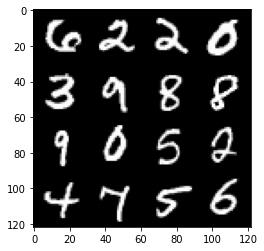

106: step 49800 / Gen loss: 2.5368982235590587 / disc_loss: 0.21822142933805774


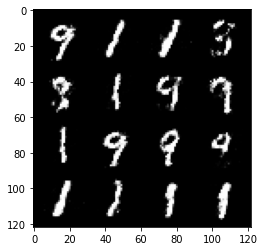

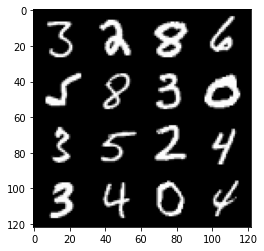

106: step 50100 / Gen loss: 2.4786230687300375 / disc_loss: 0.22867163822054853


  0%|          | 0/469 [00:00<?, ?it/s]

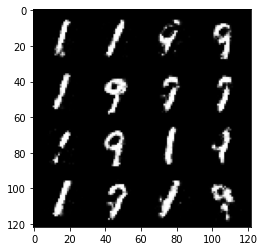

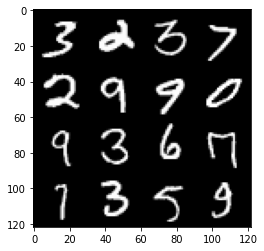

107: step 50400 / Gen loss: 2.447305498520534 / disc_loss: 0.23228194062908492


  0%|          | 0/469 [00:00<?, ?it/s]

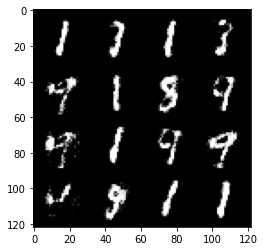

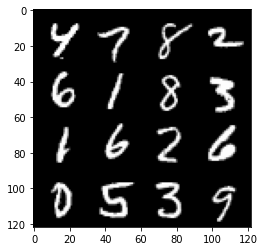

108: step 50700 / Gen loss: 2.26800441265106 / disc_loss: 0.2603909884393217


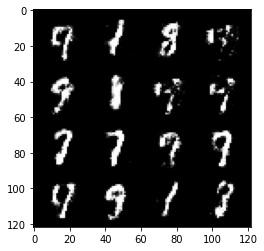

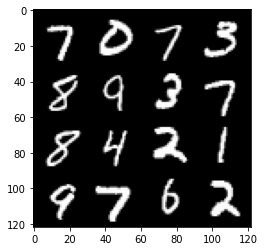

108: step 51000 / Gen loss: 2.3925217886765786 / disc_loss: 0.253347780307134


  0%|          | 0/469 [00:00<?, ?it/s]

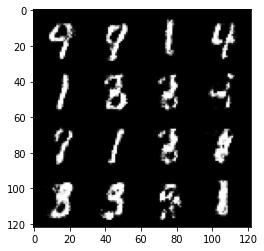

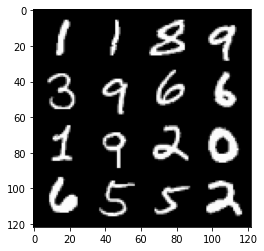

109: step 51300 / Gen loss: 2.3559140233198828 / disc_loss: 0.25361800308028865


  0%|          | 0/469 [00:00<?, ?it/s]

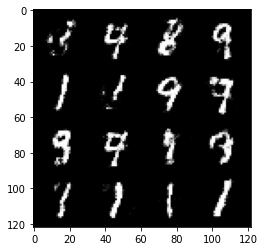

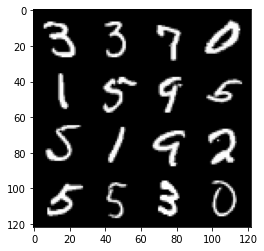

110: step 51600 / Gen loss: 2.22864046494166 / disc_loss: 0.27230568756659795


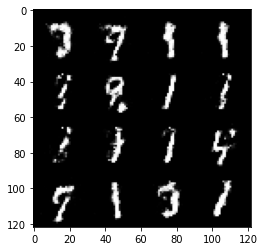

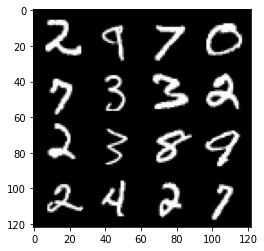

110: step 51900 / Gen loss: 2.1840453922748555 / disc_loss: 0.2744248967369397


  0%|          | 0/469 [00:00<?, ?it/s]

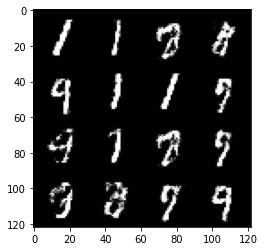

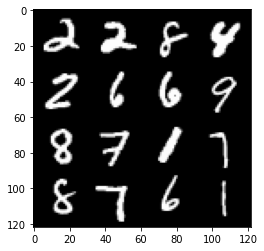

111: step 52200 / Gen loss: 2.301943413416544 / disc_loss: 0.23985277588168774


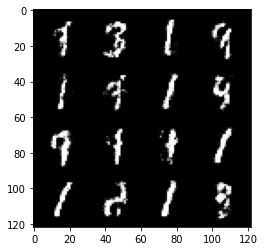

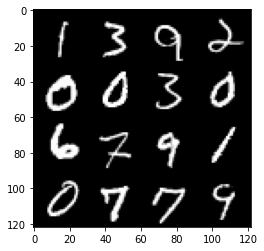

111: step 52500 / Gen loss: 2.298077166477841 / disc_loss: 0.24307620361447307


  0%|          | 0/469 [00:00<?, ?it/s]

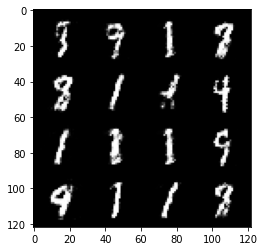

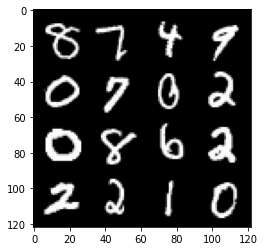

112: step 52800 / Gen loss: 2.285064445734025 / disc_loss: 0.26017437090476364


  0%|          | 0/469 [00:00<?, ?it/s]

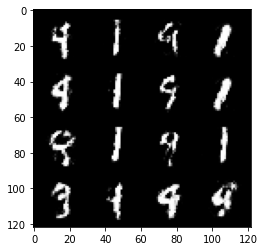

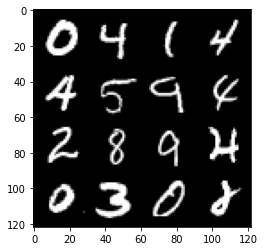

113: step 53100 / Gen loss: 2.176227016051609 / disc_loss: 0.26881906484564155


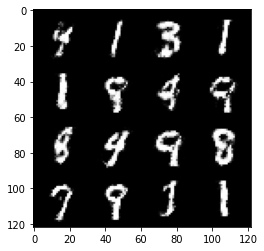

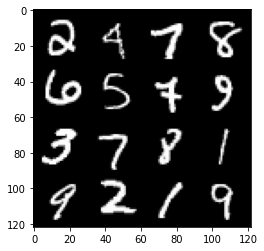

113: step 53400 / Gen loss: 2.1011807330449406 / disc_loss: 0.2888963170846305


  0%|          | 0/469 [00:00<?, ?it/s]

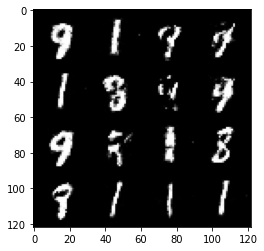

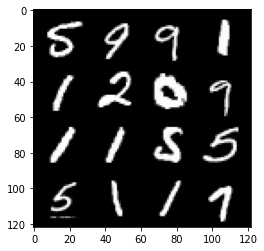

114: step 53700 / Gen loss: 2.125991882085802 / disc_loss: 0.28154872606198


  0%|          | 0/469 [00:00<?, ?it/s]

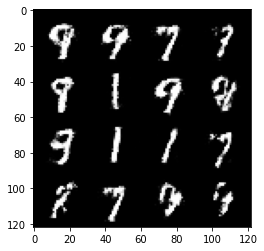

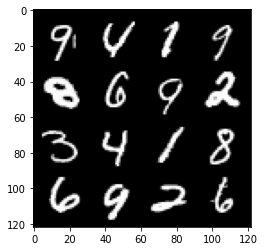

115: step 54000 / Gen loss: 2.089337076346077 / disc_loss: 0.2812544419368108


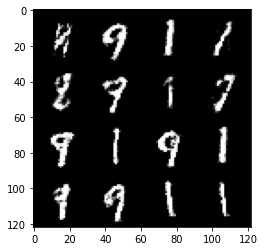

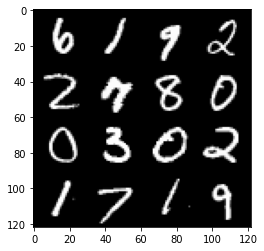

115: step 54300 / Gen loss: 2.10698224703471 / disc_loss: 0.2788152237733205


In [ ]:
for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    # discriminator
    disc_opt.zero_grad()

    cur_bs=len(real) # real: 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)
    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    # generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    # visualization & stats
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1